<div class="alert alert-info">
<h2> Исследования рынка общественного питания в Москве для принятия решения об
открытии нового заведения <a class="tocSkip"></h2> 

<b>Цель:</b> проанализировать рынок заведений общественного питания Москвы и предоставить данные для выбора подходящего места для инвестирования клиенту
    
<b>Задачи:</b>   
    - найти интересные особенности мест для инвестирования;
    - презентовать полученные результаты анализа;
 
<b> Содержание:</b>
   1. Предобработка данных;
   2. Анализ данных;
   3. Дополнительный анализ данных кофеен;
   4. Выводы.

<b>Датасет для анализа:</b> заведения общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 
    
<b>Куда входят следующие данные:</b>   
1. общие данные (название и категория завадений, их часы работы, количество посадочных мест и является ли он сетью);
2. географические данные (адрес, административный  район, широта и долгота географической точки, в которой находится заведение);
3. оценочные данные (рейтинг, категория цен, средняя стоимость заказа и чек, стоимость чашки кофе);

</div>

## Предобработка данных

In [1]:
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import register_matplotlib_converters
import warnings
from scipy import stats as st
import math as mth
from plotly import graph_objects as go 
import plotly.express as px

In [2]:
!pip install folium
!pip install geojson

import folium
import json 
import geojson

from folium import Map, Choropleth
from folium import Marker, Map
from folium.plugins import MarkerCluster

In [3]:
# таблицу и разделалила столбцы
places = pd.read_csv('datasets/moscow_places.csv', sep=',')

places

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


### Проверка дубликатов и пропусков

In [4]:
#проверка информации о данных
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
#проверка явных дубликатов
places.duplicated().sum()

0

In [6]:
#проверка неявных дубликатов, где чаще всего бывают дубликаты
places[places['address'].duplicated() ==  True]['address']

7            Москва, Клязьминская улица, 9, стр. 3
20                 Москва, Правобережная улица, 1Б
31                      Москва, улица Дыбенко, 7/1
41                      Москва, улица Дыбенко, 7/1
48                Москва, улица Дыбенко, 7, стр. 1
                           ...                    
8401                 Москва, Профсоюзная улица, 56
8402    Москва, Пролетарский проспект, 19, корп. 1
8403        Москва, Люблинская улица, 112А, стр. 1
8404        Москва, Люблинская улица, 112А, стр. 1
8405                Москва, Россошанский проезд, 6
Name: address, Length: 2653, dtype: object

In [7]:
#проверка дубликатов при сопоставлении адресов с названиями заведений
places['location'] = places['address'] + places['name']
places['location'].duplicated().sum()

0

In [8]:
#привела к нижнему регистру и удалила возможные пробелы в названии заведений
places['name'] = places['name'].str.lower()
places['name'] = places['name'].map(str.strip)
places['name'].unique()

array(['wowфли', 'четыре комнаты', 'хазри', ..., 'миславнес', 'самовар',
       'kebab time'], dtype=object)

In [9]:
#привела к нижнему регистру и удалила возможные пробелы в названии улиц
places['address'] = places['address'].str.lower()
places['address'] = places['address'].map(str.strip)
places['address'].unique()

array(['москва, улица дыбенко, 7/1', 'москва, улица дыбенко, 36, корп. 1',
       'москва, клязьминская улица, 15', ...,
       'москва, улица лобачевского, 52, корп. 1',
       'москва, болотниковская улица, 52, корп. 2',
       'москва, чонгарский бульвар, 26а, корп. 1'], dtype=object)

In [10]:
#проверила дубликаты
places_check = places[places.duplicated(subset=['name', 'address'], keep=False)]
places_check.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,location
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN,"Москва, парк Ангарские ПрудыКафе"
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN,"Москва, парк Ангарские прудыКафе"
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,"Москва, Волоколамское шоссе, 11, стр. 2More poke"
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,"Москва, Волоколамское шоссе, 11, стр. 2More Poke"
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0,"Москва, проспект Мира, 118Раковарня Клешни и Х..."


In [11]:
#удалила строки с индексом содержащие дубликаты
places.drop_duplicates(subset=['name','address'])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,location
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,"Москва, улица Дыбенко, 7/1WoWфли"
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,"Москва, улица Дыбенко, 36, корп. 1Четыре комнаты"
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,"Москва, Клязьминская улица, 15Хазри"
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,"Москва, улица Маршала Федоренко, 12Dormouse Co..."
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,"Москва, Правобережная улица, 1БИль Марко"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,"Москва, Профсоюзная улица, 56Суши Мания"
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,"Москва, Пролетарский проспект, 19, корп. 1Мисл..."
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,"Москва, Люблинская улица, 112А, стр. 1Самовар"
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,"Москва, Люблинская улица, 112А, стр. 1Чайхана ..."


<div class="alert alert-block alert-info"> 
<b> Проверка дубликатов:</b> были выявлены и удалены четыре дубликата </div>

In [12]:
# проверка пропусков
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
location                0
dtype: int64

In [13]:
# проверка столбцов с пропусками
places[places.columns[places.isnull().any()]]

,hours,price,avg_bill,middle_avg_bill,middle_coffee_cup,seats
0,"ежедневно, 10:00–22:00",NaN,NaN,NaN,NaN,NaN
1,"ежедневно, 10:00–22:00",выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,4.0
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",средние,Средний счёт:от 1000 ₽,1000.0,NaN,45.0
3,"ежедневно, 09:00–22:00",NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,NaN
4,"ежедневно, 10:00–22:00",средние,Средний счёт:400–600 ₽,500.0,NaN,148.0
...,...,...,...,...,...,...
8401,"ежедневно, 09:00–02:00",NaN,NaN,NaN,NaN,86.0
8402,"ежедневно, 08:00–22:00",NaN,NaN,NaN,NaN,150.0
8403,"ежедневно, круглосуточно",NaN,Средний счёт:от 150 ₽,150.0,NaN,150.0
8404,"ежедневно, круглосуточно",NaN,NaN,NaN,NaN,150.0


<div class="alert alert-block alert-info"> 
<b> Проверка пропусков:</b> были найдены пропуски в шести столбцах (hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats) с большой долей количества пропусков. Изменив их есть значительный риск влияния на результаты, поэтому было решено их оставить без изменений. </div>

In [14]:
# создан столбец с названием улиц
places['street'] = places['address'].str.split(',').str[1]
#удалены лишние пробелы
places['street'] = places['street'].map(str.strip)
places['street'].unique()

array(['улица дыбенко', 'клязьминская улица', 'улица маршала федоренко',
       ..., 'улица хлобыстова', 'новороссийская улица',
       'чонгарский бульвар'], dtype=object)

In [15]:
# создан столбец с завадениями, которые работают ежедневно и круглосуточно 
#с логическим значениями True (если заведение работает ежедневно и круглосуточно) и False (в противоположном случае)
places['is_24/7'] = places['hours'].str.contains('ежедневно, круглосуточно', case = False, na=False)
places['is_24/7']

0       False
1       False
2       False
3       False
4       False
        ...  
8401    False
8402    False
8403     True
8404     True
8405     True
Name: is_24/7, Length: 8406, dtype: bool

In [16]:
#подсчет заведений, работающих круглосуточно и ежедневно
places['is_24/7'].value_counts()

False    7676
True      730
Name: is_24/7, dtype: int64

In [17]:
#подсчет доли заведений, работающих круглосуточно и ежедневно в процентах
print('Доля заведений, которые работают круглосуточно и ежедневно:', round((places['is_24/7'].mean()*100),2), '%')

Доля заведений, которые работают круглосуточно и ежедневно: 8.68 %


## Анализ данных

In [18]:
#подсчет количества и процент посадочных мест в заведениях по категориям
places_count = places.pivot_table(index='category', values ='name', aggfunc = 'count').reset_index()
places_count ['percent'] = round((places_count['name']/places_count['name'].sum()),3)*100
places_count = places_count.sort_values('name',ascending=False)
places_count

,category,name,percent
3,кафе,2378,28.3
6,ресторан,2043,24.3
4,кофейня,1413,16.8
0,"бар,паб",765,9.1
5,пиццерия,633,7.5
2,быстрое питание,603,7.2
7,столовая,315,3.7
1,булочная,256,3.0


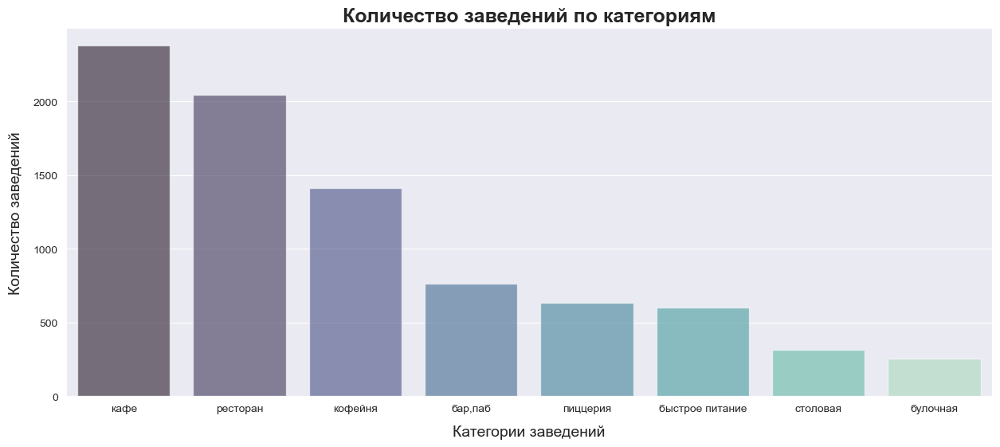

In [19]:
#график заведений по категориям
sns.set_style('darkgrid')
plt.figure(figsize=(15, 6))
sns.barplot(x='category', y='name', data=places_count, order=places_count['category'], palette='mako', alpha=.6)
plt.title('Количество заведений по категориям', fontsize=18, weight = 'bold')
plt.xlabel('Категории заведений', labelpad=10, weight='normal', size=14)
plt.ylabel('Количество заведений', labelpad=10, weight='normal', size=14)
plt.show()

<div class="alert alert-block alert-info"> 
<b> Подсчет количества заведений общественного питания по категориям:</b>  больше всего представлено кафе(28.3%), ресторанов(24,3%) и кофеен (16,8%), а меньше всего столовых (3,7%) и булочных(3%). </div>

In [20]:
#подсчет количества посадочных мест в заведениях по категориям
seats_count = places.pivot_table(index='category', values ='seats', aggfunc = 'count').reset_index()
seats_count.sort_values('seats',ascending=False)

,category,seats
6,ресторан,1270
3,кафе,1218
4,кофейня,751
0,"бар,паб",468
5,пиццерия,427
2,быстрое питание,349
7,столовая,164
1,булочная,148


In [21]:
#подсчет медианного количества посадочных мест по категориям
seats_median = places.pivot_table(index='category', values ='seats', aggfunc = 'median').reset_index()
seats_median = seats_median.sort_values('seats',ascending=False)
seats_median.columns = ['category', 'median']
seats_median

,category,median
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


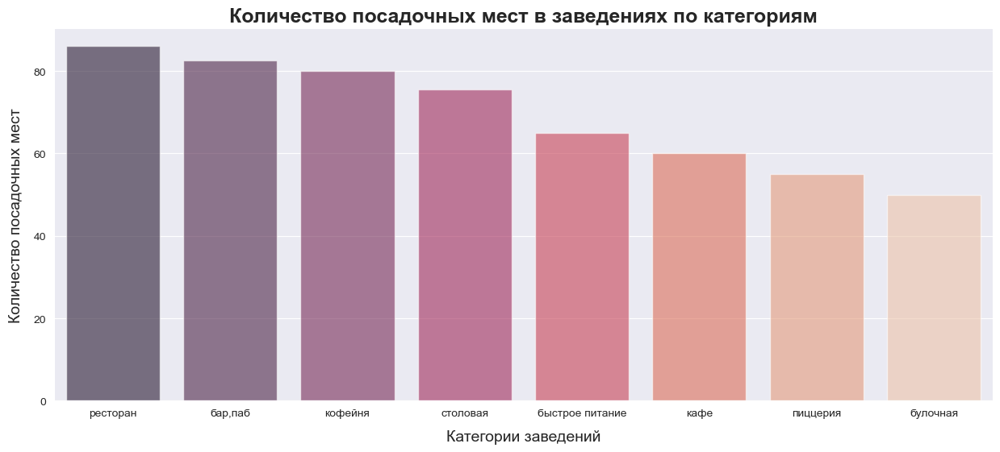

In [22]:
#график заведений по количеству посадочных мест
sns.set_style('darkgrid')
plt.figure(figsize=(15, 6))
sns.barplot(x='category', y='median', data=seats_median, order=seats_median['category'], palette='rocket', alpha=.6)
plt.title('Количество посадочных мест в заведениях по категориям', fontsize=18, weight = 'bold')
plt.xlabel('Категории заведений', labelpad=10, weight='normal', size=14)
plt.ylabel('Количество посадочных мест', labelpad=10, weight='normal', size=14)

plt.show()

### Количество сетевых и несетевых заведений

In [23]:
# подсчет количества сетевых и несетевых заведений в датасете
chain_count = places.pivot_table(index='chain', values ='name', aggfunc = 'count').reset_index()
chain_count ['percent'] = round((chain_count['name']/chain_count['name'].sum()),3)*100
chain_count.loc[0, ['chain']] = ['несетевое заведение']
chain_count.loc[1, ['chain']] = ['сетевое заведение']
chain_count 

,chain,name,percent
0,несетевое заведение,5201,61.9
1,сетевое заведение,3205,38.1


In [24]:
#количество сетевых и несетевых заведений на pie chart
fig = go.Figure(data=[go.Pie(labels=chain_count['chain'], 
                             values=chain_count['percent'],
                             hole=.3,                        
                             textinfo='label+percent'
                             )]) 
fig.update_layout(title='Соотношение сетевых и несетевых заведений, %', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Количество заведений',
                                    showarrow=False)])
fig.update_traces(marker=dict(colors=['lavender', 'skyblue']))
fig.show()

<div class="alert alert-block alert-info"> 
<b> Соотношение сетевых и несетевых заведений общественного питания:</b>  больше всего несетевых заведений (61,9%), а сетевых заведенией всего - 38,1%. </div>

In [25]:
#подсчет заведений, которые чаще являются сетевыми
chain_categ = places.groupby('category').agg(
    {'chain':'sum', 'name':'count'}).sort_values(by='name', ascending=False).reset_index()
chain_categ.columns = ['category', 'chain_numb', 'places_total']
chain_categ['ratio, %'] = round((chain_categ['chain_numb']/chain_categ['places_total']),3)*100
chain_categ['chain_percent,%'] = round((chain_categ['chain_numb']/chain_categ['chain_numb'].sum()),3)*100
chain_categ = chain_categ.sort_values('ratio, %',ascending=False)
chain_categ

,category,chain_numb,places_total,"ratio, %","chain_percent,%"
7,булочная,157,256,61.3,4.9
4,пиццерия,330,633,52.1,10.3
2,кофейня,720,1413,51.0,22.5
5,быстрое питание,232,603,38.5,7.2
1,ресторан,730,2043,35.7,22.8
0,кафе,779,2378,32.8,24.3
6,столовая,88,315,27.9,2.7
3,"бар,паб",169,765,22.1,5.3


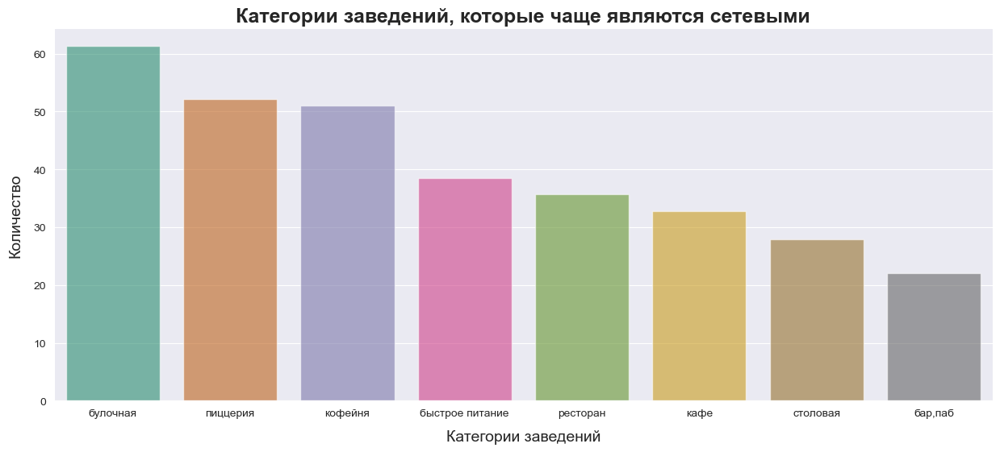

In [26]:
#график категории заведений, которые чаще являются сетевыми  
sns.set_style('darkgrid')
plt.figure(figsize=(15, 6))
sns.barplot(x='category', y='ratio, %', data=chain_categ, order=chain_categ['category'], palette='Dark2', alpha=.6)
plt.title('Категории заведений, которые чаще являются сетевыми', fontsize=18, weight = 'bold')
plt.xlabel('Категории заведений', labelpad=10, weight='normal', size=14)
plt.ylabel('Количество', labelpad=10, weight='normal', size=14)
plt.show()

<div class="alert alert-block alert-info">

<b>Подсчет сетевых заведений общественного питания по категориям:</b> чаще всего сетевыми являются булочные, пиццерии и кофейни, а меньше всего бары и пабы. </div>

In [27]:
#топ-15 популярных сетей в Москве
top_chain = places.query('chain == 1').pivot_table(index='name', values='category', aggfunc='count').\
sort_values(by='category', ascending=False).reset_index()
top15_chain = top_chain.head(15)
top15_chain

,name,category
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


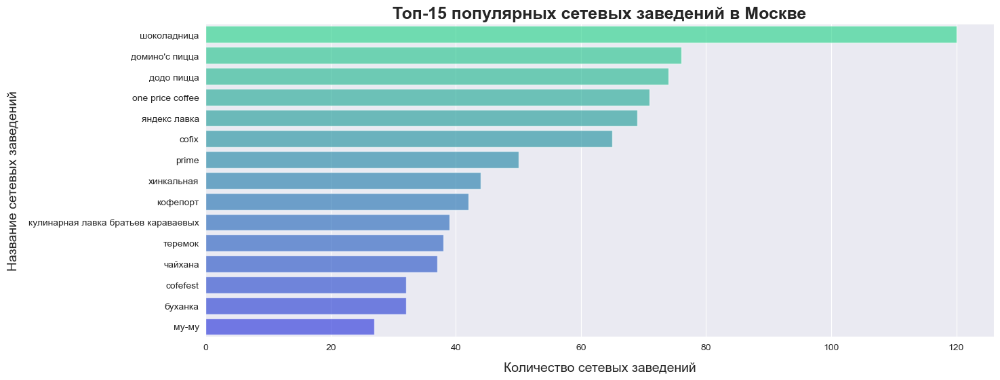

In [28]:
#график топ-15 популярных сетей
sns.set_style('darkgrid')
plt.figure(figsize=(15, 6))
sns.barplot(x='category', y='name', data=top15_chain, order=top15_chain['name'], palette='winter_r', alpha=.6, orient='h')
plt.title('Топ-15 популярных сетевых заведений в Москве', fontsize=18, weight = 'bold')
plt.xlabel('Количество сетевых заведений', labelpad=10, weight='normal', size=14)
plt.ylabel('Название сетевых заведений', labelpad=10, weight='normal', size=14)
plt.show()

In [29]:
#топ-15 популярных сетей по категориям
top15_chain_categ = (places.query('name in @top15_chain.name').\
                     pivot_table(index='name', values='address', columns='category', aggfunc='count',margins=True)\
                     .sort_values(by='All', ascending=False)
                    )
top15_chain_categ

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
name,,,,,,,,,
All,4.0,25.0,12.0,100.0,337.0,152.0,186.0,2.0,818
шоколадница,NaN,NaN,NaN,1.0,119.0,NaN,NaN,NaN,120
домино'с пицца,NaN,NaN,NaN,NaN,NaN,77.0,NaN,NaN,77
додо пицца,NaN,NaN,NaN,NaN,NaN,74.0,NaN,NaN,74
one price coffee,NaN,NaN,NaN,NaN,72.0,NaN,NaN,NaN,72
яндекс лавка,NaN,NaN,NaN,NaN,NaN,NaN,69.0,NaN,69
cofix,NaN,NaN,NaN,NaN,65.0,NaN,NaN,NaN,65
prime,NaN,NaN,NaN,1.0,NaN,NaN,49.0,NaN,50
хинкальная,3.0,NaN,6.0,19.0,NaN,NaN,15.0,1.0,44


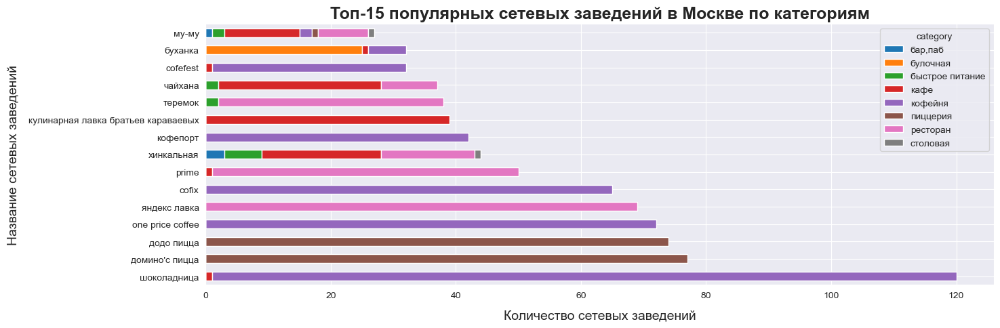

In [30]:
#график топ-15 популярных сетей по категориям
top15_chain_categ.drop('All', axis=1)\
.drop('All')\
.plot(kind='barh', stacked = True, figsize=(15,5))
plt.title('Топ-15 популярных сетевых заведений в Москве по категориям', fontsize=18, weight = 'bold')
plt.xlabel('Количество сетевых заведений', labelpad=10, weight='normal', size=14)
plt.ylabel('Название сетевых заведений', labelpad=10, weight='normal', size=14)
plt.show()

<div class="alert alert-block alert-info">

<b>Популярные сетевые заведения:</b> в топ-15 популярных сетевых заведений общественного питания вошли знакомые сети как Шоколадница, Домино'с и Додо пицца и т.д. Соответственно основными категориями популярных заведений являются - кофейни, кафе и пиццерии. </div>


In [31]:
#подсчет количества заведений по административным районам Москвы 
district_count = places.pivot_table(index='district', values='category', aggfunc='count').\
sort_values(by='category', ascending=False).reset_index()
district_count['percent'] = round((district_count['category']/district_count['category'].sum()),3)*100
district_count

,district,category,percent
0,Центральный административный округ,2242,26.7
1,Северный административный округ,900,10.7
2,Южный административный округ,892,10.6
3,Северо-Восточный административный округ,891,10.6
4,Западный административный округ,851,10.1
5,Восточный административный округ,798,9.5
6,Юго-Восточный административный округ,714,8.5
7,Юго-Западный административный округ,709,8.4
8,Северо-Западный административный округ,409,4.9


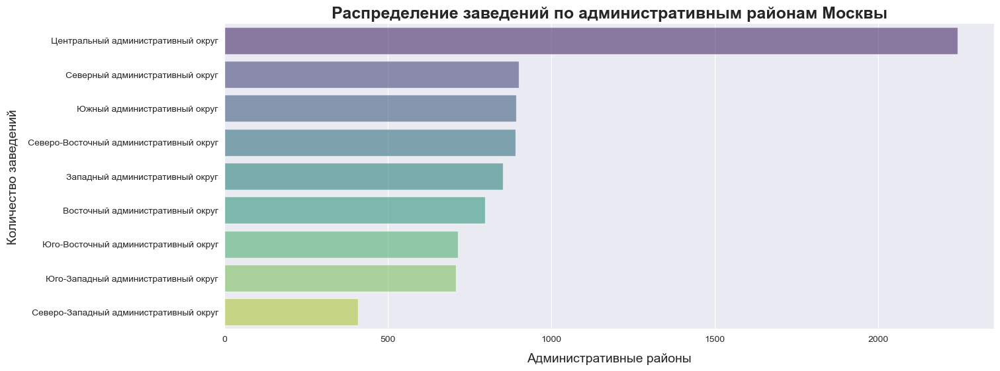

In [32]:
#график количества заведений по административным районам Москвы 
sns.set_style('darkgrid')
plt.figure(figsize=(15, 6))
sns.barplot(x='category', y='district', data=district_count, order=district_count['district'], palette='viridis', alpha=.6, orient='h')
plt.title('Распределение заведений по административным районам Москвы', fontsize=18, weight = 'bold')
plt.xlabel('Административные районы', labelpad=10, weight='normal', size=14)
plt.ylabel('Количество заведений', labelpad=10, weight='normal', size=14)
plt.show()

In [33]:
#подсчет количества заведений по административным районам Москвы и по категориям
district_categ = (places.query('name in @top15_chain.name').\
                     pivot_table(index='district', values='address', columns='category', aggfunc='count',margins=True)\
                     .sort_values(by='All', ascending=False)
                    )
district_categ

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
district,,,,,,,,,
All,4.0,25.0,12.0,100.0,337.0,152.0,186.0,2.0,818
Центральный административный округ,1.0,1.0,2.0,47.0,95.0,9.0,59.0,1.0,215
Южный административный округ,NaN,NaN,NaN,4.0,34.0,23.0,28.0,NaN,89
Западный административный округ,NaN,5.0,1.0,8.0,41.0,15.0,18.0,NaN,88
Северный административный округ,NaN,8.0,NaN,7.0,40.0,20.0,13.0,NaN,88
Северо-Восточный административный округ,NaN,6.0,2.0,6.0,37.0,19.0,15.0,NaN,85
Восточный административный округ,2.0,1.0,2.0,6.0,30.0,21.0,18.0,1.0,81
Юго-Западный административный округ,1.0,1.0,1.0,9.0,25.0,16.0,17.0,NaN,70
Юго-Восточный административный округ,NaN,NaN,2.0,12.0,15.0,16.0,11.0,NaN,56


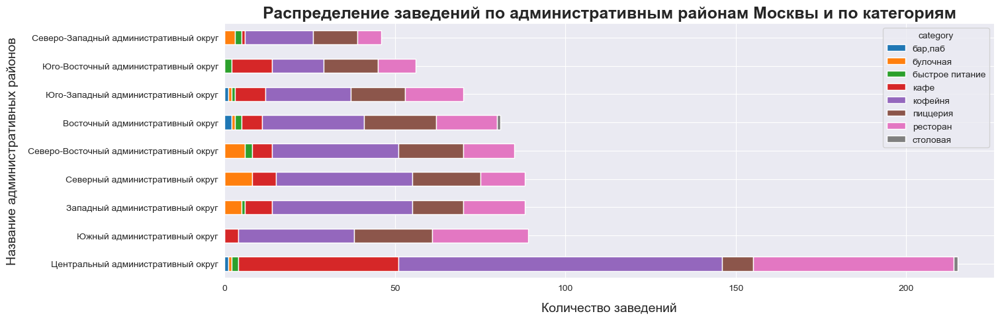

In [34]:
# график распределения заведений по административным районам Москвы и по категориям
district_categ.drop('All', axis=1)\
.drop('All')\
.plot(kind='barh', stacked = True, figsize=(15,5))
plt.title('Распределение заведений по административным районам Москвы и по категориям', fontsize=18, weight = 'bold')
plt.xlabel('Количество заведений', labelpad=10, weight='normal', size=14)
plt.ylabel('Название административных районов', labelpad=10, weight='normal', size=14)
plt.show()

<div class="alert alert-block alert-info">

<b>Распределение заведений общественного питания по районам и категориям:</b> больше всего заведений общественного питания находятся в центральном административном округе, а также в таких районах как северный, южный и серево-восточный административные округа. В основном преобладают такие заведения общественного питания как кофейни, рестораны и кафе, особенно в центральном административном округе </div>

In [35]:
#подсчет распределения средних рейтингов по категориям заведений
rating_categ = places.groupby('category')['rating'].mean().sort_values(ascending=False).reset_index()
rating_categ

,category,rating
0,"бар,паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.290357
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123886
7,быстрое питание,4.050249


In [36]:
data = px.data.election()
fig = px.bar(rating_categ.sort_values(by='rating', ascending=False), x='category', y='rating', title='Cредний рейтингов по категориям заведений')
fig.update_layout(title='Cредний рейтинг заведений по категориям',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Категория заведения',
                   width = 1600, height = 800
                
)
fig.update_traces(width=0.5)
fig.add_shape(
    type="line", line_color="salmon", line_width=3, opacity=1, line_dash="dot",
    x0=0, x1=1, xref="paper", y0=4.38, y1=4.38, yref="y"
)
fig.show() 




<div class="alert alert-block alert-info">

<b>Средний рейтинг заведений по категориям:</b> высокие рейтинги преобладают у таких категорий заведений как бары и пабы,а также пиццерии и рестораны. Однако, усреднённые рейтинги в разных типах общепита не сильно различаются. Значения представлены от 4,05 до 4,38.  </div>

In [37]:
#средний рейтинг заведений
rating_name = places.groupby('name', as_index=False)['rating'].agg('median')
rating_name

,name,rating
0,#кешбэккафе,4.0
1,+39 pizzeria mozzarella bar,4.8
2,1 этаж,4.3
3,1-я креветочная,3.7
4,10 идеальных пицц,4.3
...,...,...
5507,ясно,4.4
5508,яуза,4.4
5509,ё-ланч,4.0
5510,ёж и устрица,4.8


In [38]:
folium.__version__

'0.14.0'

In [39]:
#все заведения на карте (folium)
moscow_lat, moscow_lng = 55.751244, 37.618423


moscow = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(moscow)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

places.apply(create_clusters, axis=1)

moscow

In [40]:
#средний рейтинг заведений каждого района
rating_district = places.groupby('district', as_index=False)['rating'].agg('mean')
rating_district

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [41]:
#Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

folium.Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdYlGn_r',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Средний рейтинг заведений по районам',
    reset=True
).add_to(m)

folium.LayerControl().add_to(m)

m

<div class="alert alert-block alert-info">

<b>Средний рейтинг заведений каждого района:</b> Лучше всех средний рейтинг у центрального административного округа, а у остальных рейтинг не значительно ниже.</div>

In [42]:
#топ-15 популярных улиц по количеству заведений
top_street = places.pivot_table(index='street', values='name', aggfunc='count').\
sort_values(by='name', ascending=False).reset_index()
top15_street = top_street.head(15)
top15_street.columns=['street', 'quantity']
top15_street

,street,quantity
0,проспект мира,184
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


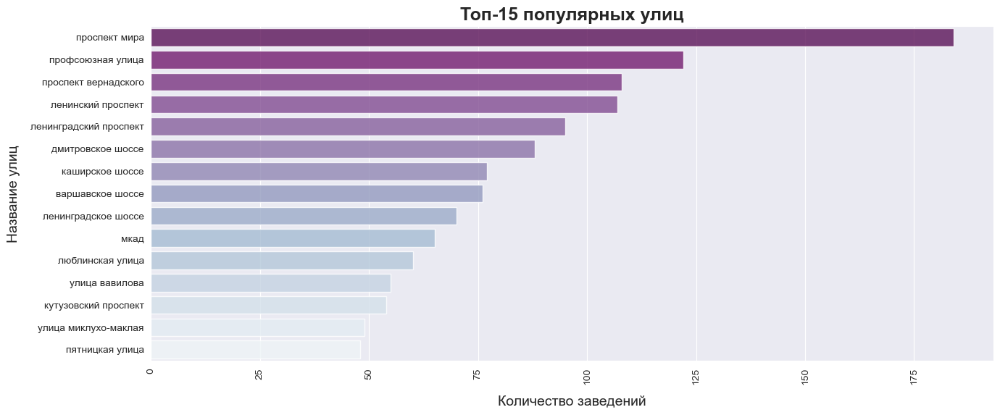

In [43]:
#график топ-15 популярных улиц по количеству заведений
sns.set_style('darkgrid')
plt.figure(figsize=(15, 6))
sns.barplot(x='quantity', y='street', data=top15_street, order=top15_street['street'], palette='BuPu_r', alpha=.8, orient='h')
plt.title('Топ-15 популярных улиц', fontsize=18, weight = 'bold')
plt.xlabel('Количество заведений', labelpad=10, weight='normal', size=14)
plt.ylabel('Название улиц', labelpad=10, weight='normal', size=14)
plt.xticks(rotation=90)
plt.show()

<div class="alert alert-block alert-info">

<b>Топ самых популярных улиц:</b> проспект Мира, Профсоюзная улица, проспект Вернадского и Ленинский проспект имеют больше 100 различных заведений.</div>

In [44]:
#топ-15 популярных улиц по категориям
top15_street_categ = (places.query('street in @top15_street.street').\
                     pivot_table(index='street', values='address', columns='category', aggfunc='count',margins=True)\
                     .sort_values(by='All', ascending=False)
                    )
top15_street_categ


category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
street,,,,,,,,,
All,91.0,26.0,117.0,353.0,220.0,84.0,327.0,40.0,1258
проспект мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,184
профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122
проспект вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108
ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107
ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95
дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88
каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0,77
варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0,76


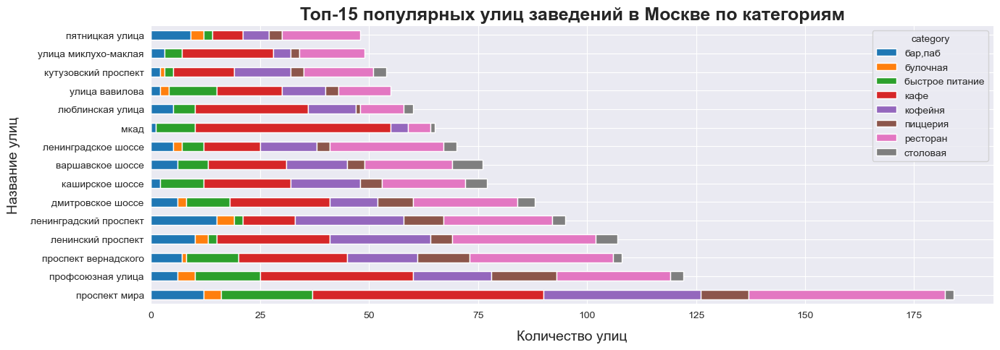

In [45]:
#график топ-15 популярных улиц по категориям
top15_street_categ.drop('All', axis=1)\
.drop('All')\
.plot(kind='barh', stacked = True, figsize=(15,5))
plt.title('Топ-15 популярных улиц заведений в Москве по категориям', fontsize=18, weight = 'bold')
plt.xlabel('Количество улиц', labelpad=10, weight='normal', size=14)
plt.ylabel('Название улиц', labelpad=10, weight='normal', size=14)
plt.show()


In [46]:
#улицы и их район, на которых находится только один объект общепита
street_district =  places.pivot_table(index=['street', 'district'], values='name', aggfunc='count').\
sort_values(by='name', ascending=True).reset_index()
street_district = street_district.loc[(street_district['name'] ==1)]
street_district.columns=['street', 'district', 'quantity']
street_district

,street,district,quantity
0,1-й автозаводский проезд,Южный административный округ,1
1,новороссийская улица,Юго-Восточный административный округ,1
2,новосущёвская улица,Северо-Восточный административный округ,1
3,новощукинская улица,Северо-Западный административный округ,1
4,новоясеневский тупик,Юго-Западный административный округ,1
...,...,...,...
470,барвихинская улица,Западный административный округ,1
471,1-й котляковский переулок,Южный административный округ,1
472,андроньевская площадь,Центральный административный округ,1
473,басманный тупик,Центральный административный округ,1


In [47]:
#количество улиц и их районов, на которых находится только один объект общепита
street_district.nunique()

street      474
district      9
quantity      1
dtype: int64

In [48]:
#подсчет районов с большим количеством улиц с одним объектом общепита
street_district_count = street_district.pivot_table(index='district', values='quantity', aggfunc='count').\
sort_values(by='quantity', ascending=False).reset_index()
street_district_count['percent'] = round((street_district_count['quantity']/street_district_count['quantity'].sum()),3)*100
street_district_count.columns=['district', 'quantity', 'percent']
street_district_count

,district,quantity,percent
0,Центральный административный округ,148,31.2
1,Северо-Восточный административный округ,56,11.8
2,Восточный административный округ,52,10.9
3,Северный административный округ,52,10.9
4,Южный административный округ,50,10.5
5,Юго-Восточный административный округ,42,8.8
6,Западный административный округ,36,7.6
7,Северо-Западный административный округ,21,4.4
8,Юго-Западный административный округ,18,3.8


In [49]:
#график районов с большим количеством улиц с одним объектом общепита
data = px.data.election()
fig = px.bar(street_district_count.sort_values(by='quantity', ascending=True), x='quantity', y='district')
fig.update_layout(title='Административные районы Москвы с улицами с одним заведением',
                   xaxis_title='Количество заведений',
                   yaxis_title='Административные районы Москвы')
fig.show()

In [50]:
street_district_cao = street_district.loc[(street_district['district'] == 'ЦАО')]
street_district_cao

,street,district,quantity


<div class="alert alert-block alert-info">

<b>Распределение улиц с одним объектом общепита:</b> всего было найдено 475 улиц, на которых находится только один объект общепита. Больше всего таких улиц в центральном административном округе (31,1%). Это может быть объяснено тем, что в центре много переулков и небольших улиц, в которых мало вероятно будет больше одного общепита.</div>

In [51]:
#средний чек заведений по районам
district_bill = places.pivot_table(index='district', values='middle_avg_bill', aggfunc=['median', 'mean']).reset_index()
district_bill.columns = ['district', 'median', 'mean']
district_bill = district_bill.sort_values(by='median', ascending=False)
district_bill

,district,median,mean
1,Западный административный округ,1000.0,1053.225490
5,Центральный административный округ,1000.0,1191.057547
4,Северо-Западный административный округ,700.0,822.222930
2,Северный административный округ,650.0,927.959627
7,Юго-Западный административный округ,600.0,792.561702
0,Восточный административный округ,575.0,820.626923
3,Северо-Восточный административный округ,500.0,716.611296
8,Южный административный округ,500.0,834.398089
6,Юго-Восточный административный округ,450.0,654.097938


In [52]:
#Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

folium.Choropleth(
    geo_data=state_geo,
    data=district_bill,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Средний рейтинг заведений',
    reset=True
).add_to(m)
folium.LayerControl().add_to(m)
m


<div class="alert alert-block alert-info">

<b>Значения средних чеков заведений:</b> дороже всего цены заведений в центральном и западном административных округах, а дешевле всего в заведениях находящихся в юго-восточном административном округе. Карта показывает, что чем дальше от центра находится завадение, тем ниже у них средний чек.</div>

### Общий вывод:

**Категории:**
- Исследование рынка Москвы показало, что по категориям большинство заведений являются кафе (28.3%), ресторанами (24,3%) и кофейнями (16,8%). Меньше всего представлены такие категории общественного питания, как столовые (3,7%) и булочные(3%).
- Анализ посадочных мест в заведениях общественного питания также показал, что больше всего посадочных мест у ресторанов (26,5%), кафе (25,4%) и кофеен (15,7%). Аналогично, меньше всего посадочных мест в столовых (3,4%) и булочных (3,1%).
- При анализе соотношения сетевых и несетевых заведений, было выявлено, что больше половина заведений являются несетевыми (61,9%), а сетевых заведений всего - 38,1%
- В основном сетевыми заведениями общественного питания являются кафе(24,3%), рестораны(22,8%) и кофейни(22,5%), а меньше всего столовые(2,7%).
- В топ-15 популярных сетевых заведений общественного питания входят большие всем известные сети как Шоколадница, Домино'с и Додо пицца и т.д. 

**Расположение:**
- Анализ расположений данных завадений выявил, что популярностью пользуется центральный административный округ. Также популярны такие районы как северный, южный и серево-восточный административные округа. Количество заведений каждой категории по районам показала, что больше всего кофеен, ресторанов и кафе, особенно в центральном административном округе.
- Более того, в центральном административном округе больше всего улиц, где представлены только одно заведение (31,1%). В основом это переулки и небольшие улицы.
- Самыми популярными улицами являются: проспект Мира, Профсоюзная улица, проспект Вернадского и Ленинский проспект и т.д.
- Средний рейтинг по категориям заведений больше всего получили бары и пабы, а также пиццерии и рестораны. Однако, усреднённые рейтинги в разных типах общепита не сильно различаются.
- Средний чек выше всего у заведений находящихся в центральном и западном административных округах, а дешевле в юго-восточном административном округе. То есть, чем дальше от центра находится завадение, тем ниже у них средний чек.


## Дополнительный анализ данных кофеен

In [53]:
#подсчет количества кофеен
сoffeeshops = places.query('category == "кофейня"').pivot_table(index='name', values='category', aggfunc='count').\
sort_values(by='category', ascending=False).reset_index()
сoffeeshops

,name,category
0,шоколадница,119
1,one price coffee,72
2,cofix,65
3,кофепорт,42
4,cofefest,31
...,...,...
821,o.k. coffee,1
822,oda coffee,1
823,omg coffee,1
824,one and double,1


In [54]:
#общее количество кофеен
print('Количество кофеен в Москве:',сoffeeshops['category'].sum())

Количество кофеен в Москве: 1413


In [55]:
#подсчет кофеен по районам Москвы
сoffeeshops_district = places.query('category == "кофейня"').pivot_table(index='district', values='name', aggfunc='count').\
sort_values(by='name', ascending=False).reset_index()
сoffeeshops_district['percent'] = round((сoffeeshops_district['name']/сoffeeshops_district['name'].sum()),3)*100
сoffeeshops_district.columns=['district', 'quantity', 'percent']
сoffeeshops_district

,district,quantity,percent
0,Центральный административный округ,428,30.3
1,Северный административный округ,193,13.7
2,Северо-Восточный административный округ,159,11.3
3,Западный административный округ,150,10.6
4,Южный административный округ,131,9.3
5,Восточный административный округ,105,7.4
6,Юго-Западный административный округ,96,6.8
7,Юго-Восточный административный округ,89,6.3
8,Северо-Западный административный округ,62,4.4


In [71]:
#график кофеен по районам Москвы
data = px.data.election()
fig = px.bar(сoffeeshops_district.sort_values(by='quantity', ascending=True), x='quantity', y='district')
fig.update_layout(title='Расположение кофеен в административных районах Москвы',
                   xaxis_title='Количество кофеен',
                   yaxis_title='Административные районы Москвы')
fig.show()

In [58]:
#круглосуточные кофейни
allday= places.loc[places['is_24/7'] == True]
allday

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,location,street,is_24/7
10,great room bar,"бар,паб","москва, левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0,"Москва, Левобережная улица, 12Great Room Bar",левобережная улица,True
17,чайхана беш-бармак,ресторан,"москва, ленинградское шоссе, 71б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,"Москва, Ленинградское шоссе, 71Б, стр. 2Чайхан...",ленинградское шоссе,True
19,пекарня,булочная,"москва, ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,"Москва, Ижорский проезд, 5Пекарня",ижорский проезд,True
24,drive café,кафе,"москва, улица дыбенко, 9ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN,"Москва, улица Дыбенко, 9Ас1Drive Café",улица дыбенко,True
49,2u-ту-ю,пиццерия,"москва, ижорская улица, 8а",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN,"Москва, Ижорская улица, 8А2U-Ту-Ю",ижорская улица,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8394,намангале,кафе,"москва, ферганская улица, вл17-21",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.705332,37.819244,4.3,NaN,NaN,NaN,NaN,0,NaN,"Москва, Ферганская улица, вл17-21Намангале",ферганская улица,True
8399,"пекарня, кафе-гриль",булочная,"москва, болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0,"Москва, Болотниковская улица, 52, корп. 2Пекар...",болотниковская улица,True
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,"Москва, Люблинская улица, 112А, стр. 1Самовар",люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,"Москва, Люблинская улица, 112А, стр. 1Чайхана ...",люблинская улица,True


In [59]:
#подсчет круглосуточных кофеен
сoffee_allday = allday.query('category == "кофейня"').pivot_table(index='name', values='is_24/7', aggfunc='count').\
sort_values(by='is_24/7', ascending=False).reset_index()
сoffee_allday

,name,is_24/7
0,шоколадница,17
1,кофемания,8
2,wild bean cafe,6
3,wild bean,5
4,кофе хауз,3
5,кофе с собой,2
6,you&coffee,2
7,cofix,2
8,столица,1
9,пирог хауз,1


In [60]:
print('Количество круглосуточных кофеен в Москве:',сoffee_allday['is_24/7'].sum())

Количество круглосуточных кофеен в Москве: 59


In [61]:
#посчитала соотношение сетевых и несетевых кафе
chain_coffeeshop = places.query('category == "кофейня"').pivot_table(index='chain', values ='name', aggfunc = 'count').reset_index()
chain_coffeeshop ['percent'] = round((chain_coffeeshop['name']/chain_coffeeshop['name'].sum()),3)*100
chain_coffeeshop.loc[0, ['chain']] = ['несетевое заведение']
chain_coffeeshop.loc[1, ['chain']] = ['сетевое заведение']
chain_coffeeshop 

,chain,name,percent
0,несетевое заведение,693,49.0
1,сетевое заведение,720,51.0


In [62]:
#pie chart соотношения сетевых и несетевых кафе
fig = go.Figure(data=[go.Pie(labels=chain_coffeeshop['chain'], 
                             values=chain_coffeeshop['percent'],
                             hole=.3,                        
                             textinfo='label+percent'
                             )]) 
fig.update_layout(title='Соотношение сетевых и несетевых кофеен, %', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Количество кофеен',
                                    showarrow=False)])
fig.update_traces(marker=dict(colors=['#9f9bbc', '#a1cec5']))
fig.show() 

In [63]:
#рейтинг кофеин и их распределение по районам
coffeeshop_rating = places.query('category == "кофейня"').groupby(['name','district'], as_index=False)['rating'].agg('mean')
coffeeshop_rating = coffeeshop_rating.sort_values(by='rating', ascending=False)
coffeeshop_rating

,name,district,rating
61,bread head,Северо-Западный административный округ,5.0
395,pique-nique,Северный административный округ,5.0
235,family bakery,Южный административный округ,5.0
45,big black cup coffee,Юго-Восточный административный округ,5.0
220,dormouse coffee shop,Северный административный округ,5.0
...,...,...,...
724,кофейня,Юго-Восточный административный округ,2.8
93,cinnabon,Северо-Восточный административный округ,2.6
350,monty cafe,Северный административный округ,2.3
498,wild bean cafe,Юго-Восточный административный округ,2.3


In [64]:
#хороплет рейтинга кофеен и их распределение по районам
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

folium.Choropleth(
    geo_data=state_geo,
    data=coffeeshop_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Рейтинг кофеен',
    reset=True
).add_to(m)
folium.LayerControl().add_to(m)
m


In [65]:
#подсчет заведений получающие наивысшую оценку по районам
coffeeshop_rating_dist = coffeeshop_rating.query('rating == 5.0').pivot_table(index='district', values='name', aggfunc='count').\
sort_values(by='name', ascending=False).reset_index()
coffeeshop_rating_dist['percent'] = round((coffeeshop_rating_dist['name']/coffeeshop_rating_dist['name'].sum()),3)*100
coffeeshop_rating_dist.columns=['district', 'quantity', 'percent']
coffeeshop_rating_dist

,district,quantity,percent
0,Северный административный округ,12,36.4
1,Северо-Западный административный округ,4,12.1
2,Центральный административный округ,4,12.1
3,Юго-Восточный административный округ,4,12.1
4,Западный административный округ,3,9.1
5,Восточный административный округ,2,6.1
6,Южный административный округ,2,6.1
7,Северо-Восточный административный округ,1,3.0
8,Юго-Западный административный округ,1,3.0


In [66]:
#pie chart заведений получающие наивысшую оценку по районам
fig = go.Figure(data=[go.Pie(labels=coffeeshop_rating_dist['district'], 
                             values=coffeeshop_rating_dist['percent'],
                             hole=.3,                        
                             textinfo='label+percent'
                             )]) 
fig.update_layout(title='Расположение кофеен с рейтингом 5 в административных районах Москвы, %', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Административные районы Москвы',
                                    showarrow=False)])
fig.show() 

In [67]:
#подсчет стоимости чашки кофе
coffee_bill_shops = places.query('category == "кофейня"').pivot_table(index='name', values='middle_coffee_cup', aggfunc='median').reset_index()
coffee_bill_shops.columns = ['name', 'median']
coffee_bill_shops = coffee_bill_shops.sort_values(by='median', ascending=False)
coffee_bill_shops

,name,median
55,coffee fm,375.0
227,кафетериус,328.0
217,диемм,320.0
118,il tocco,315.0
99,espressium,300.0
...,...,...
18,berta,75.0
117,i-cup,75.0
83,cofix,60.0
226,кафе чудо,60.0


In [72]:
#Распределение средней стоимости чашки кофе в кофейнях
data = px.data.election()
fig = px.bar(coffee_bill_shops, x='name', y='median', title='Распределение средней стоимости чашки кофе в кофейнях',
            labels=dict(name="Название кофеен", median="Средняя стоимость кофе"))
fig.update_xaxes(tickangle=90)
fig.add_shape(
    type="line", line_color="salmon", line_width=3, opacity=1, line_dash="dot",
    x0=0, x1=1, xref="paper", y0=150, y1=150, yref="y"
)
fig.show() 

In [69]:
#подсчет медиан стоимости чашки кофе
coffee_bill = places.query('category == "кофейня"').pivot_table(index='district', values='middle_coffee_cup', aggfunc='median').reset_index()
coffee_bill.columns = ['district', 'median']
coffee_bill = coffee_bill.sort_values(by='median', ascending=False)
coffee_bill

,district,median
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [70]:
#столбчатая диаграмма распределения средней стоимости чашки кофе в кофейнях по районам
fig = px.bar(coffee_bill.sort_values(by='median', ascending=True),
             x='median',
             y='district', 
             text='median'                                 
            )
fig.update_layout(title='Распределение средней стоимости чашки кофе в кофейнях по районам',
                   xaxis_title='Средняя стоимость кофе',
                   yaxis_title='Административный округ')

fig.show()

<div class="alert alert-block alert-info">

<b>Выводы по кофейням:</b> 

- Количество кофеен в Москве порядка 1413, круглосуточно из них работают только 59, а сетевых кофеен не намного больше чем несетевых.
- Больше всего кофеен расположено в центрально округе (30,3%), северном (13,7%) и северо-восточном административных округах (11,3%). Однако, наивысшую оценку чаще всего ставят кофейням находящимся в северном административном округ.
- Стоимость чашки кофе в среднем меньше 150 рублей, но дороже всего на юго-западном, центральном и западном административных округах, где стоимость в среднем превышает 190 рублей. </div>

<div class="alert alert-block alert-info">

<b>Ссылка на презентацию:</b> https://disk.yandex.ru/i/JxeC2F_7EjUPkg </div>


## Выводы

- Популярными категориями для открытия нового заведения являются кафе, рестораны и кофейни. Привлекательным расположением для нового заведения может стать центральный и северный административные округа. 
- Для открытия кофейни более привлекательным будет центральный округ с большой концентрацией жителей и гостей столицы. Однако, в данном районе лучше рассмотреть улицы и переулки с одним заведением, поскольку в этом случае можно выделиться и отдалиться от конкурентов. 
- Для привлечения также можно рассмотреть вариант работы круглосуточно, особенно в центре такой график может пользоваться спросом в пятницу и выходные дни.
- Для доступности среднюю цену лучше оставить в пределах 150 рублей. 
- Поскольку клиент представил «Central Perk» как модель, при следовании вышеуказанных рекомендаций, будет возможность предложить людям уставших от переполненных, шумных и сетевых кофеен, атмосферную, доступную и уютную кофейню.